# Nuclei Segmentation using Detectron2

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [12]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

  Using cached PyYAML-5.1.tar.gz (274 kB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
fatal: destination path 'detectron2' already exists and is not an empty directory.
Ignoring dataclasses: markers 'python_version < "3.7"' don't match your environment


In [17]:
import torch
import numpy as np
import os
import json
import cv2
import random

from matplotlib import pyplot as plt

import detectron2
from detectron2.utils.logger import setup_logger
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.utils.visualizer import ColorMode
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

In [18]:
register_coco_instances("dataset_train", {}, "/content/drive/MyDrive/ColabNotebooks/data/NuInsSeg_Nuclei_dataset/COCO_dataset/train/coco_annotations.json", "/content/drive/MyDrive/ColabNotebooks/data/NuInsSeg_Nuclei_dataset/COCO_dataset/train")
register_coco_instances("dataset_val", {}, "/content/drive/MyDrive/ColabNotebooks/data/NuInsSeg_Nuclei_dataset/COCO_dataset/val/coco_annotations.json", "/content/drive/MyDrive/ColabNotebooks/data/NuInsSeg_Nuclei_dataset/COCO_dataset/val")

In [19]:
train_metadata = MetadataCatalog.get("dataset_train")
train_dataset_dicts = DatasetCatalog.get("dataset_train")
val_metadata = MetadataCatalog.get("dataset_val")
val_dataset_dicts = DatasetCatalog.get("dataset_val")

[12/10 14:06:51 d2.data.datasets.coco]: Loading /content/drive/MyDrive/ColabNotebooks/data/NuInsSeg_Nuclei_dataset/COCO_dataset/train/coco_annotations.json takes 1.36 seconds.
[12/10 14:06:51 d2.data.datasets.coco]: Loaded 532 images in COCO format from /content/drive/MyDrive/ColabNotebooks/data/NuInsSeg_Nuclei_dataset/COCO_dataset/train/coco_annotations.json
[12/10 14:06:52 d2.data.datasets.coco]: Loaded 133 images in COCO format from /content/drive/MyDrive/ColabNotebooks/data/NuInsSeg_Nuclei_dataset/COCO_dataset/val/coco_annotations.json


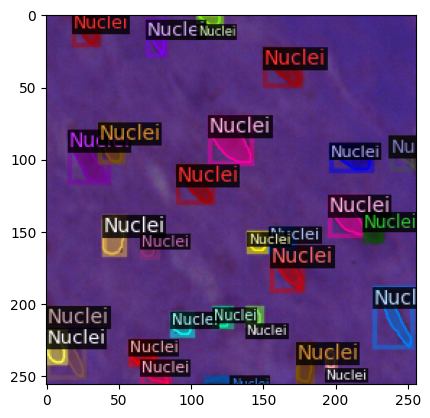

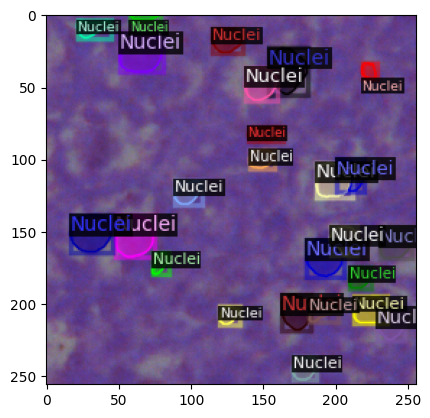

In [20]:
# Visualize some random samples
for d in random.sample(train_dataset_dicts, 2):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.show()

# Train

In [21]:
cfg = get_cfg()
cfg.OUTPUT_DIR = "/content/drive/MyDrive/ColabNotebooks/data/NuInsSeg_Nuclei_dataset/models/Detectron2_Models"
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 1000    # 1000 iterations for demo purposes
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   # Default is 512, using 256 for this dataset.
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # We have 1 classes. (Nuclei)
# NOTE: this config means the number of classes, without the background. Do not use num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) #Create an instance of of DefaultTrainer with the given congiguration
trainer.resume_or_load(resume=False) #Load a pretrained model if available (resume training) or start training from scratch if no pretrained model is available

[12/10 14:07:31 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:01, 171MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


In [22]:
trainer.train()

[12/10 14:07:38 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[12/10 14:07:52 d2.utils.events]:  eta: 0:06:49  iter: 19  total_loss: 5.174  loss_cls: 0.567  loss_box_reg: 0.447  loss_mask: 0.6915  loss_rpn_cls: 3.271  loss_rpn_loc: 0.2498    time: 0.4887  last_time: 0.3739  data_time: 0.1510  last_data_time: 0.0603   lr: 4.9953e-06  max_mem: 1771M
[12/10 14:08:04 d2.utils.events]:  eta: 0:06:40  iter: 39  total_loss: 3.951  loss_cls: 0.5802  loss_box_reg: 0.5952  loss_mask: 0.6867  loss_rpn_cls: 1.832  loss_rpn_loc: 0.2143    time: 0.4596  last_time: 0.4072  data_time: 0.0579  last_data_time: 0.0307   lr: 9.9902e-06  max_mem: 1865M
[12/10 14:08:16 d2.utils.events]:  eta: 0:06:45  iter: 59  total_loss: 2.618  loss_cls: 0.5704  loss_box_reg: 0.6462  loss_mask: 0.6744  loss_rpn_cls: 0.5005  loss_rpn_loc: 0.2121    time: 0.5091  last_time: 0.4580  data_time: 0.2440  last_data_time: 0.1075   lr: 1.4985e-05  max_mem: 1865M
[12/10 14:08:25 d2.utils.events]:  eta: 0:06:30  iter: 79  total_loss: 2.484  loss_cls: 0.5536  loss_box_reg: 0.6696  loss_mask: 0.

In [23]:
# Look at training curves in tensorboard:
%load_ext tensorboard
# %reload_ext tensorboard  #Reload in case you have already loaded it once

%tensorboard --logdir /content/drive/MyDrive/ColabNotebooks/data/NuInsSeg_Nuclei_dataset/models/Detectron2_Models/ --port 6007

Output hidden; open in https://colab.research.google.com to view.

In [28]:
import yaml
import os
# Save the configuration to a config.yaml file
# Save the configuration to a config.yaml file
config_yaml_path = "/content/drive/MyDrive/ColabNotebooks/data/NuInsSeg_Nuclei_dataset/models/Detectron2_Models/config-5k_iter.yaml"
with open(config_yaml_path, 'w') as file:
    yaml.dump(cfg, file)

#Save the model weights with a different name so we don't accidentally overwrite our model.
os.rename(os.path.join(cfg.OUTPUT_DIR, "model_final.pth"), os.path.join(cfg.OUTPUT_DIR, "model_10k_iter.pth"))

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/ColabNotebooks/data/NuInsSeg_Nuclei_dataset/models/Detectron2_Models/model_final.pth' -> '/content/drive/MyDrive/ColabNotebooks/data/NuInsSeg_Nuclei_dataset/models/Detectron2_Models/model_10k_iter.pth'

# Inference and Evaluation

In [29]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_10k_iter.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2   # set a custom threshold
predictor = DefaultPredictor(cfg)

[12/10 14:18:41 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/ColabNotebooks/data/NuInsSeg_Nuclei_dataset/models/Detectron2_Models/model_10k_iter.pth ...


In [31]:
register_coco_instances("dataset_test", {}, "/content/drive/MyDrive/ColabNotebooks/data/NuInsSeg_Nuclei_dataset/COCO_dataset/test/coco_annotations.json", "/content/drive/MyDrive/ColabNotebooks/data/NuInsSeg_Nuclei_dataset/COCO_dataset/test")
test_metadata = MetadataCatalog.get("dataset_test")
test_dataset_dicts = DatasetCatalog.get("dataset_test")

[12/10 14:46:35 d2.data.datasets.coco]: Loading /content/drive/MyDrive/ColabNotebooks/data/NuInsSeg_Nuclei_dataset/COCO_dataset/test/coco_annotations.json takes 1.41 seconds.
[12/10 14:46:35 d2.data.datasets.coco]: Loaded 133 images in COCO format from /content/drive/MyDrive/ColabNotebooks/data/NuInsSeg_Nuclei_dataset/COCO_dataset/test/coco_annotations.json


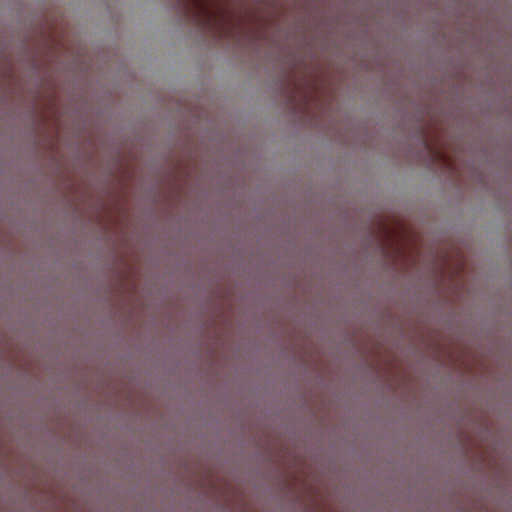

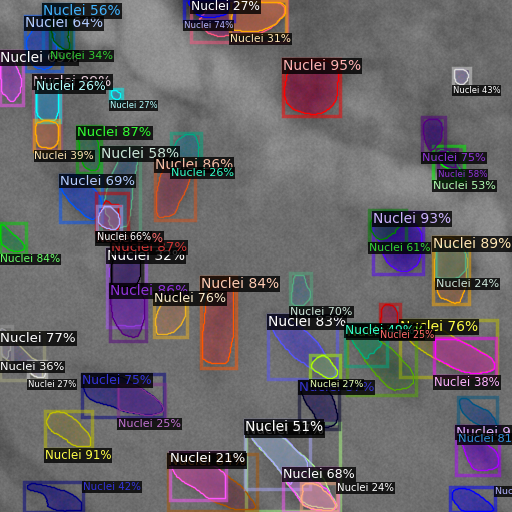

In [32]:
for d in random.sample(test_dataset_dicts, 1):    #select number of images for display
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=test_metadata,
                   scale=1,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(im[:, :, ::-1])
    cv2_imshow(out.get_image()[:, :, ::-1])

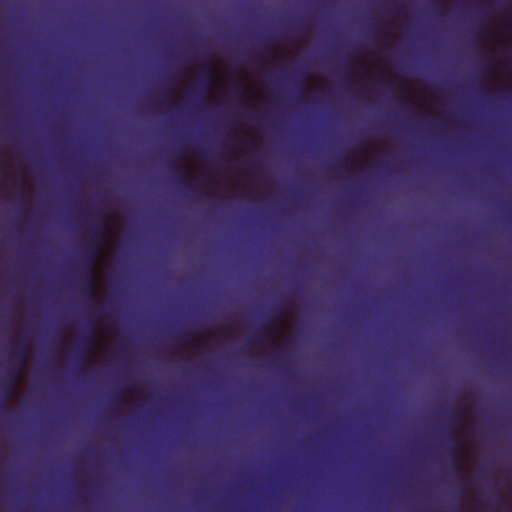

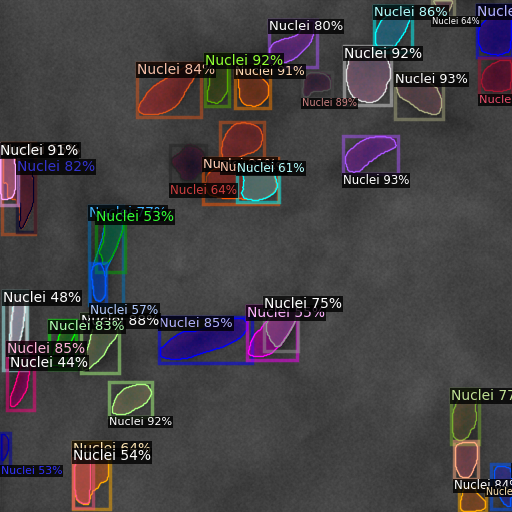

In [33]:
for d in random.sample(test_dataset_dicts, 1):    #select number of images for display
    im = cv2.imread(d["file_name"])
    outputs2 = predictor(im)

    # Perform prediction on the tile using your trained model
    outputs2 = predictor(im)

    # Get the confidence scores
    scores = outputs2["instances"].scores

    # Define your custom threshold
    threshold = 0.4

    # Filter instances based on confidence threshold
    filtered_indices = [i for i, score in enumerate(scores) if score > threshold]

    # Update the instances in the outputs
    outputs2["instances"] = outputs2["instances"][filtered_indices]

    v = Visualizer(im[:, :, ::-1],
                   metadata=test_metadata,
                   scale=1,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs2["instances"].to("cpu"))
    cv2_imshow(im[:, :, ::-1])
    cv2_imshow(out.get_image()[:, :, ::-1])

In [34]:
evaluator = COCOEvaluator("dataset_test", output_dir="./output")
test_loader = build_detection_test_loader(cfg, "dataset_test")
print(inference_on_dataset(predictor.model, test_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[12/10 14:47:02 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
[12/10 14:47:02 d2.data.datasets.coco]: Loaded 133 images in COCO format from /content/drive/MyDrive/ColabNotebooks/data/NuInsSeg_Nuclei_dataset/COCO_dataset/test/coco_annotations.json
[12/10 14:47:02 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|   Nuclei   | 6693         |
|            |              |
[12/10 14:47:02 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/10 14:47:02 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[12/10 14:47:02 d2.data.common]: Serializing 133 elements to byte tensors and concatenating them all ...
[12/10 14:47:02 d2.data.common]: Serialized dataset takes 1.74 MiB
[12/10 14:47:02 d2.evaluation.e

Loading a new image and segmenting it

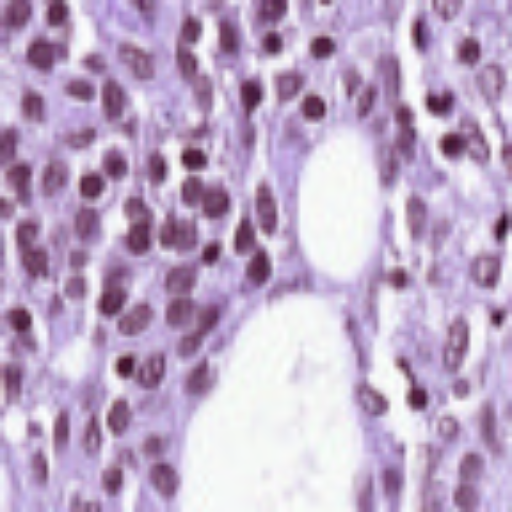

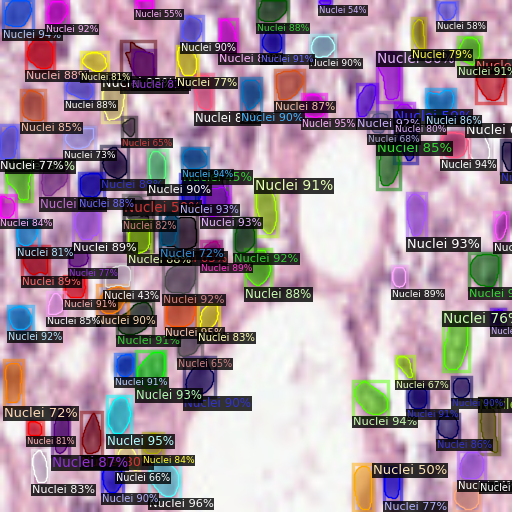

In [41]:
def resize_image(image_path, new_size):
  """
  Resizes an image to the specified dimensions using OpenCV.

  Args:
    image_path: Path to the input image file.
    new_size: Tuple (width, height) representing the desired new size.

  Returns:
    The resized image as a NumPy array, or None if the image could not be loaded.
  """
  try:
    img = cv2.imread(image_path)
    if img is None:
      print(f"Error: Could not load image at {image_path}")
      return None
    resized_img = cv2.resize(img, new_size)
    return resized_img
  except Exception as e:
    print(f"An error occurred: {e}")
    return None

new_im = cv2.imread("/content/drive/MyDrive/ColabNotebooks/data/NuInsSeg_Nuclei_dataset/COCO_dataset/test/my_test_image.png")
new_width, new_height = 512, 512
resized_image = resize_image(image_path, (new_width, new_height))
outputs = predictor(resized_image)

# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(resized_image[:, :, ::-1], metadata=train_metadata)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

cv2_imshow(resized_image[:, :, ::-1])
cv2_imshow(out.get_image()[:, :, ::-1])